In [2]:
import numpy as np
import pandas as pd
from scipy.ndimage import gaussian_filter
from sklearn.metrics import accuracy_score
import random

from tqdm.notebook import tqdm
from joblib import Parallel, delayed

import matplotlib.pyplot as plt
from PIL import Image
Image.MAX_IMAGE_PIXELS = None
pd.set_option('display.max_columns', 500)

#Personal library for some machine learning alg. implementations
import myML

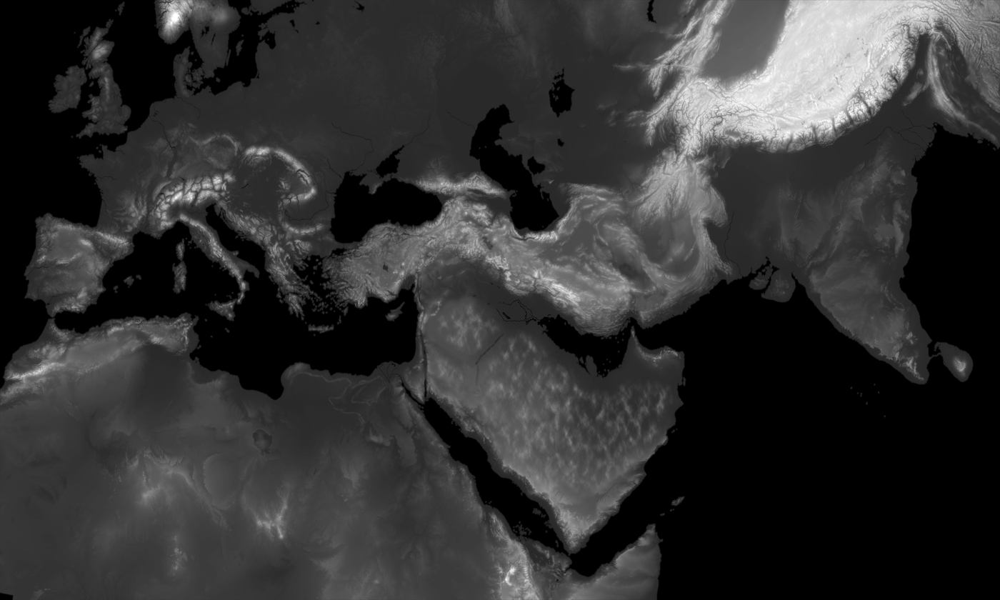

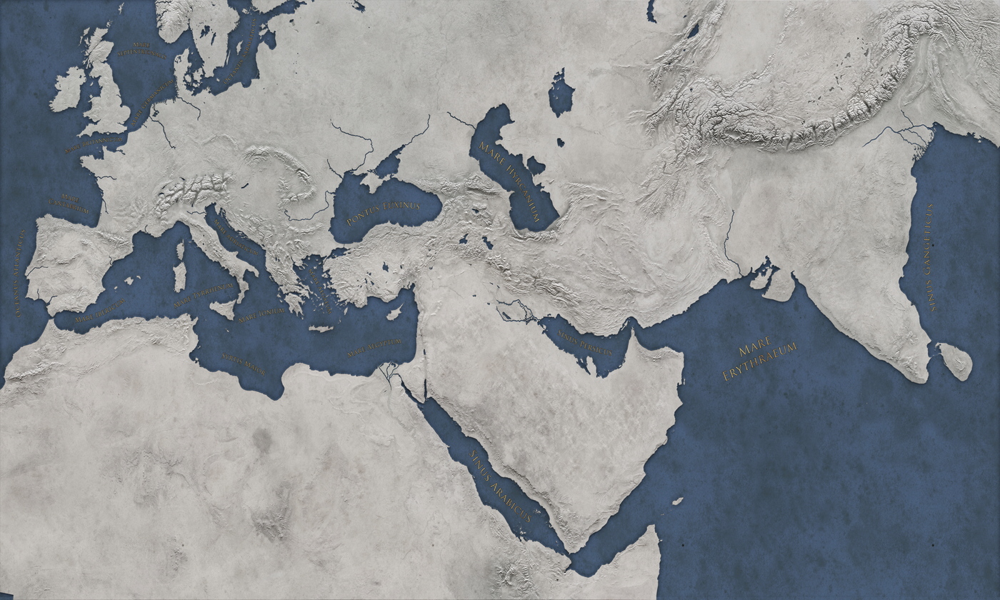

In [3]:
imX = Image.open(r"training/heightmap.png","r").convert('L').resize((1400,840), Image.Resampling.LANCZOS)
imY = Image.open(r"training/flatmap.png","r").convert('RGB').resize((1400,840), Image.Resampling.LANCZOS)
display(imX)
display(imY)

In [42]:
x_train = np.array(imX).reshape((1,840,1400,1))/255
y_train = np.array(imY).reshape((1,840,1400,3))/255

from keras.models import Sequential
from keras.layers import MaxPooling2D, Conv2D, Conv2DTranspose

model = Sequential()

model.add(Conv2D(32, kernel_size=3, activation='relu', padding='same', input_shape=(None,None,1)))
model.add(MaxPooling2D(pool_size=(2, 2), padding='same'))
model.add(Conv2D(32, kernel_size=3, activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2, 2), padding='same'))

model.add(Conv2DTranspose(32, (3, 3), strides=2, activation="relu", padding="same"))
model.add(Conv2DTranspose(32, (3, 3), strides=2, activation="relu", padding="same"))
model.add(Conv2DTranspose(3, (3, 3), activation="sigmoid", padding="same"))

model.compile(loss='mean_squared_error', optimizer='adam')
model.summary()

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_17 (Conv2D)          (None, None, None, 32)    320       
                                                                 
 max_pooling2d_17 (MaxPoolin  (None, None, None, 32)   0         
 g2D)                                                            
                                                                 
 conv2d_18 (Conv2D)          (None, None, None, 32)    9248      
                                                                 
 max_pooling2d_18 (MaxPoolin  (None, None, None, 32)   0         
 g2D)                                                            
                                                                 
 conv2d_transpose_29 (Conv2D  (None, None, None, 32)   9248      
 Transpose)                                                      
                                                     

In [43]:
def get_model_memory_usage(batch_size, model):
    import numpy as np
    try:
        from keras import backend as K
    except:
        from tensorflow.keras import backend as K

    shapes_mem_count = 0
    internal_model_mem_count = 0
    for l in model.layers:
        layer_type = l.__class__.__name__
        if layer_type == 'Model':
            internal_model_mem_count += get_model_memory_usage(batch_size, l)
        single_layer_mem = 1
        out_shape = l.output_shape
        if type(out_shape) is list:
            out_shape = out_shape[0]
        for s in out_shape:
            if s is None:
                continue
            single_layer_mem *= s
        shapes_mem_count += single_layer_mem

    trainable_count = np.sum([K.count_params(p) for p in model.trainable_weights])
    non_trainable_count = np.sum([K.count_params(p) for p in model.non_trainable_weights])

    number_size = 4.0
    if K.floatx() == 'float16':
        number_size = 2.0
    if K.floatx() == 'float64':
        number_size = 8.0

    total_memory = number_size * (batch_size * shapes_mem_count + trainable_count + non_trainable_count)
    gbytes = np.round(total_memory / (1024.0 ** 3), 3) + internal_model_mem_count
    return gbytes

#Predicted memory usage
get_model_memory_usage(1, model)

0.0

In [44]:
model.fit(x_train, y_train, batch_size=1, epochs=100)

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 0.0389
Epoch 2/100
1/1 [==============================] - 1s 1s/step - loss: 0.0386
Epoch 3/100
1/1 [==============================] - 1s 1s/step - loss: 0.0384
Epoch 4/100
1/1 [==============================] - 1s 1s/step - loss: 0.0381
Epoch 5/100
1/1 [==============================] - 1s 1s/step - loss: 0.0378
Epoch 6/100
1/1 [==============================] - 1s 1s/step - loss: 0.0375
Epoch 7/100
1/1 [==============================] - 1s 1s/step - loss: 0.0371
Epoch 8/100
1/1 [==============================] - 1s 1s/step - loss: 0.0366
Epoch 9/100
1/1 [==============================] - 1s 1s/step - loss: 0.0361
Epoch 10/100
1/1 [==============================] - 1s 1s/step - loss: 0.0354
Epoch 11/100
1/1 [==============================] - 1s 1s/step - loss: 0.0345
Epoch 12/100
1/1 [==============================] - 1s 1s/step - loss: 0.0336
Epoch 13/100
1/1 [==============================] - 1s 1s/step - loss: 0.

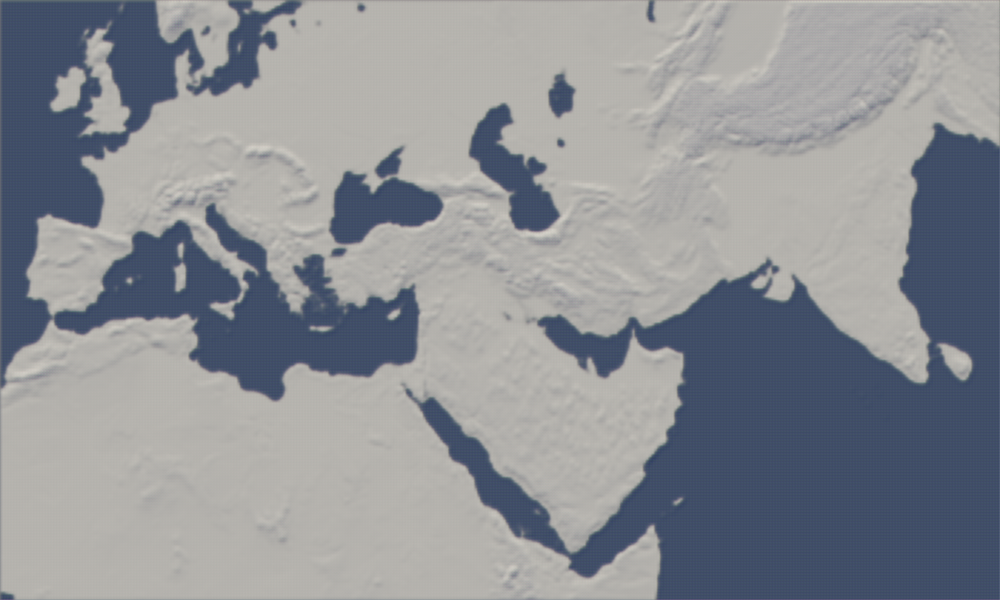

In [45]:
y_pred = (model.predict(x_train)[0,:,:,:]*255).astype(np.uint8)
y_pred = Image.fromarray(y_pred)
display(y_pred)
y_pred.save('test.png')

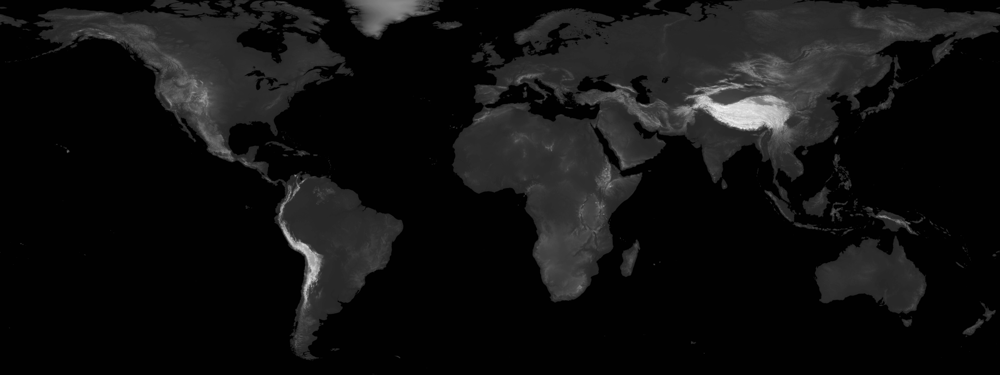

In [34]:
# Test image pixel count should be no bigger than 29.4 million if max memory is slightly higher than 10gb.
imXt = Image.open(r"input files/heightmap.png","r").convert('L').resize((8800,3300), Image.Resampling.LANCZOS)
x_test = np.array(imXt)[None,:,:,None]/255
display(imXt)

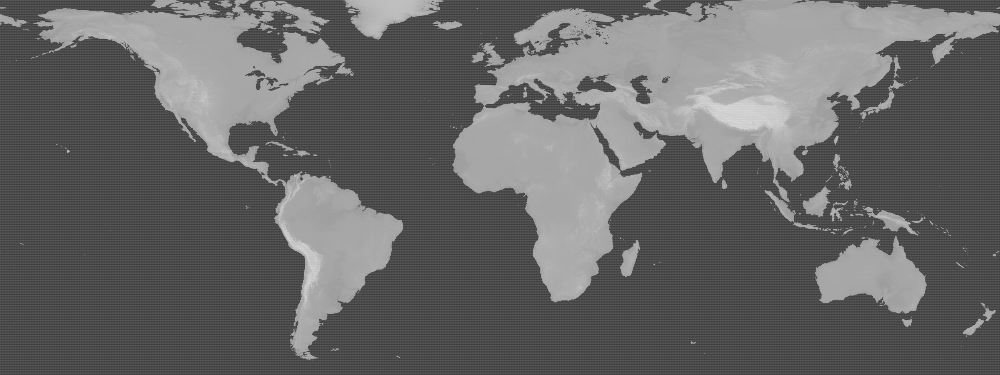

In [35]:
y_pred = (model.predict(x_test)[0,:,:,0]*255).astype(np.uint8)
y_pred = Image.fromarray(y_pred)
display(y_pred)

In [ ]:
y_pred.save('output files/flatmap.png')